In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
import warnings

In [21]:
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
data = pd.read_csv("weatherAUS.csv")

## Análisis Descriptivo

In [3]:
data.head()

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,0.0
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,0.0
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,0.0
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,1.0
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,0.2


Nos quedamos con las localidades que corresponden para el trabajo práctico:

In [11]:
data.query("Location in ('Sydney', 'SydneyAirport', 'Canberra', 'Melbourne', 'MelbourneAirport')", inplace=True)
data.drop("Unnamed: 0", axis=1, inplace=True)

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15986 entries, 30167 to 70370
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              15986 non-null  object 
 1   Location          15986 non-null  object 
 2   MinTemp           15495 non-null  float64
 3   MaxTemp           15500 non-null  float64
 4   Rainfall          15199 non-null  float64
 5   Evaporation       14280 non-null  float64
 6   Sunshine          14038 non-null  float64
 7   WindGustDir       14529 non-null  object 
 8   WindGustSpeed     14531 non-null  float64
 9   WindDir9am        15291 non-null  object 
 10  WindDir3pm        15696 non-null  object 
 11  WindSpeed9am      15725 non-null  float64
 12  WindSpeed3pm      15737 non-null  float64
 13  Humidity9am       15416 non-null  float64
 14  Humidity3pm       15461 non-null  float64
 15  Pressure9am       15251 non-null  float64
 16  Pressure3pm       15260 non-null  float64

In [13]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainfallTomorrow
count,15495.000000,15500.000000,15199.000000,14280.000000,14038.000000,14531.000000,15725.000000,15737.000000,15416.000000,15461.000000,15251.000000,15260.000000,13309.000000,13054.000000,15481.000000,15490.000000,15199.000000
mean,11.605221,21.751781,2.303744,4.866828,6.854694,44.417315,16.613672,21.797166,68.903023,51.280577,1018.305836,1016.064239,4.750545,4.746131,15.545953,20.229154,2.302586
std,5.851347,6.053679,7.385992,3.069869,3.842419,14.958027,10.336386,9.518033,15.614788,17.721335,7.400730,7.265386,2.728329,2.589879,5.559295,5.857956,7.385251
min,-8.000000,4.100000,0.000000,0.000000,0.000000,11.000000,0.000000,0.000000,11.000000,3.000000,986.700000,985.500000,0.000000,0.000000,-1.300000,3.700000,0.000000
25%,7.900000,17.100000,0.000000,2.600000,3.700000,33.000000,9.000000,15.000000,59.000000,39.000000,1013.400000,1011.200000,2.000000,2.000000,11.600000,15.900000,0.000000
50%,11.600000,21.300000,0.000000,4.200000,7.500000,43.000000,15.000000,20.000000,70.000000,51.000000,1018.500000,1016.300000,6.000000,6.000000,15.400000,19.800000,0.000000
75%,15.800000,25.800000,0.800000,6.600000,10.000000,54.000000,22.000000,28.000000,80.000000,62.000000,1023.300000,1021.000000,7.000000,7.000000,19.500000,24.100000,0.800000
max,30.500000,46.800000,119.400000,23.800000,13.900000,122.000000,69.000000,76.000000,100.000000,100.000000,1040.600000,1037.900000,9.000000,8.000000,37.200000,46.100000,119.400000


## Valores Nulos

<Axes: >

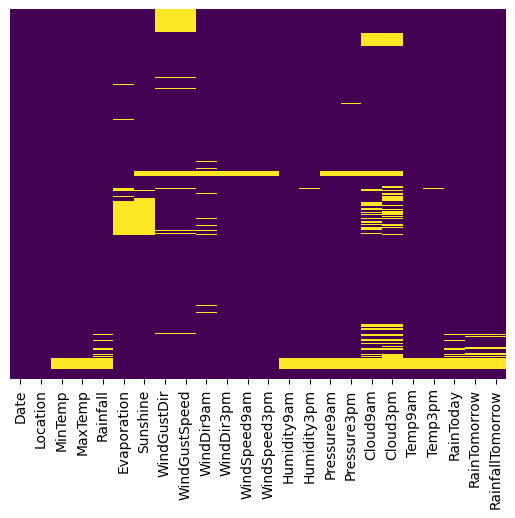

In [27]:
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False)

### Columna: *MinTemp*

<Axes: ylabel='MinTemp'>

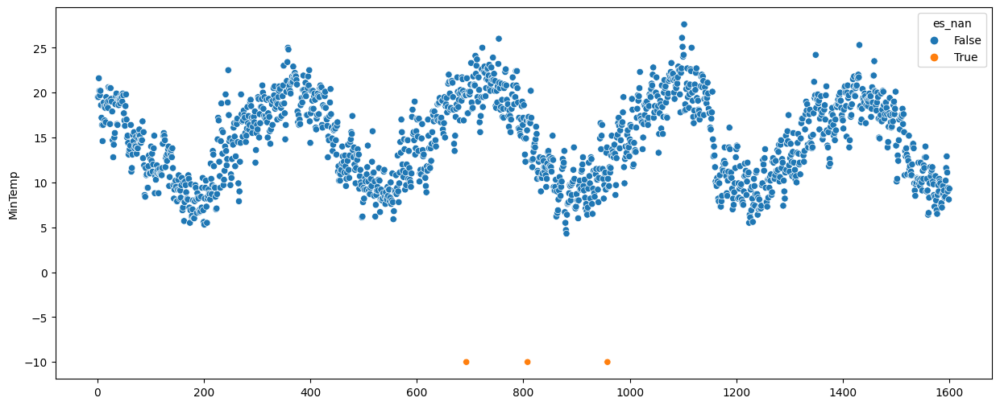

In [148]:
plt.figure(figsize=(15, 6))
mintemp = data[["MinTemp"]].copy()
mintemp.loc[:, "es_nan"] = mintemp.isnull()
mintemp.fillna(-10, inplace=True)
mintemp_slice = mintemp.iloc[:1600, :]
#mintemp_slice.interpolate(inplace=True, method="nearest")
sbn.scatterplot(data=mintemp_slice, x=range(1, mintemp_slice.shape[0] + 1), y="MinTemp", hue="es_nan")

En el gráfico, se ven con color naranja los puntos que son nulos. Debemos encontrar la mejor forma de completarlos

### Media

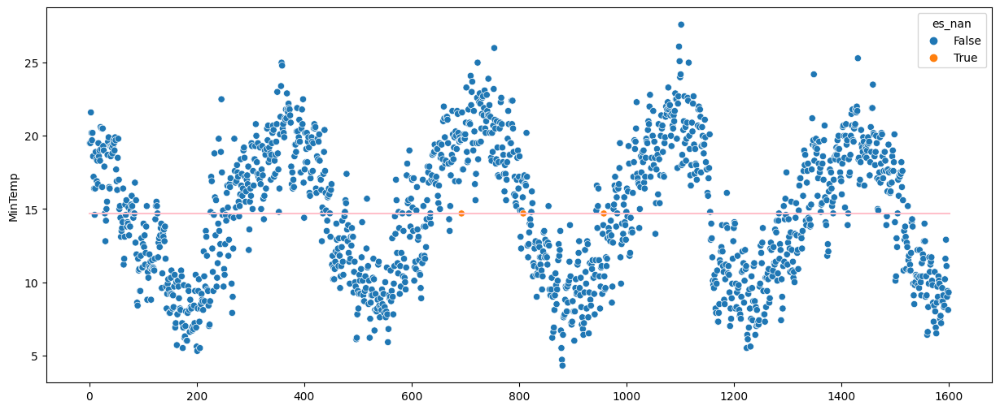

In [159]:
plt.figure(figsize=(15, 6))
media = mintemp_slice["MinTemp"].mean()
mintemp_slice.loc[mintemp_slice["es_nan"], "MinTemp"] = media
sbn.scatterplot(data=mintemp_slice, x=range(1, mintemp_slice.shape[0] + 1), y="MinTemp", hue="es_nan")
#plt.plot(range(1, mintemp_slice.shape[0] + 1), )
plt.plot([0, mintemp_slice.shape[0] + 1], [media, media], color="pink")

Vemos que reemplazar los valores por la media no es buena idea ya que no quedan posicionados correctamente. Lo mejor sería agruparlos por cercania. Entonces:

/tmp/ipykernel_9752/1956522554.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mintemp_slice.interpolate(inplace=True, method="nearest")


<Axes: ylabel='MinTemp'>

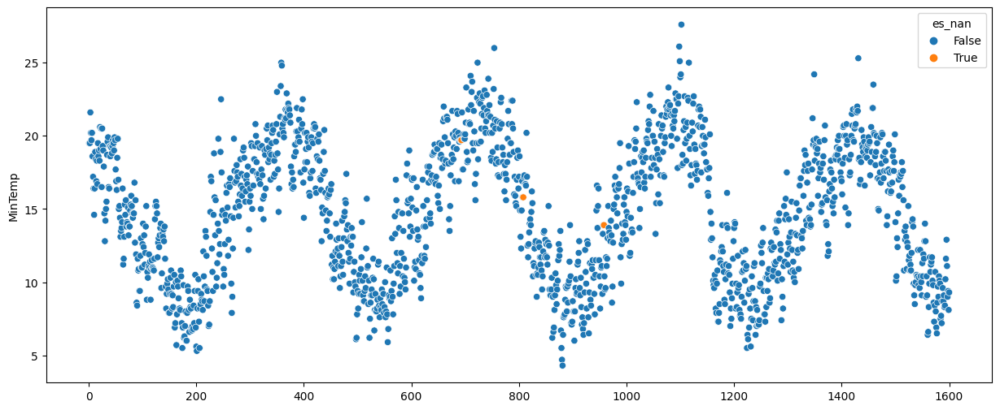

In [153]:
plt.figure(figsize=(15, 6))
mintemp = data[["MinTemp"]].copy()
mintemp.loc[:, "es_nan"] = mintemp.isnull()
mintemp_slice = mintemp.iloc[:1600, :]
mintemp_slice.interpolate(inplace=True, method="nearest")
sbn.scatterplot(data=mintemp_slice, x=range(1, mintemp_slice.shape[0] + 1), y="MinTemp", hue="es_nan")

<Axes: >

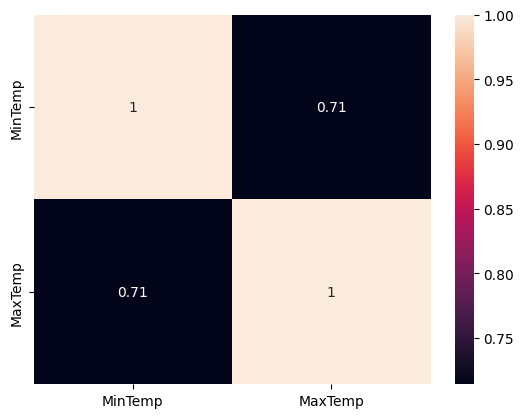

In [134]:
sbn.heatmap(data[["MinTemp", "MaxTemp"]].corr(method="spearman"), annot=True)

<Axes: >

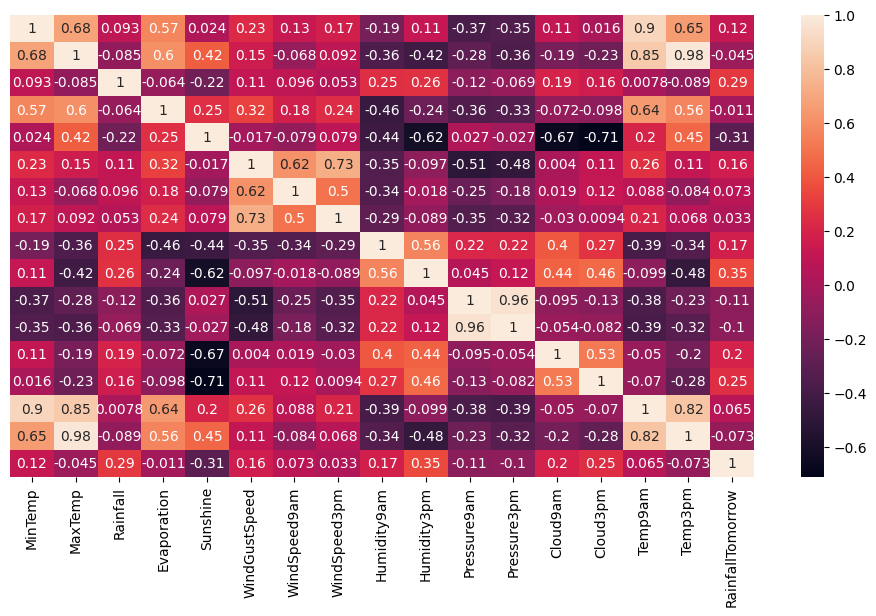

In [18]:
plt.figure(figsize=(12, 6))
sbn.heatmap(data.corr(numeric_only=True), yticklabels=False, annot=True)

/home/simon/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


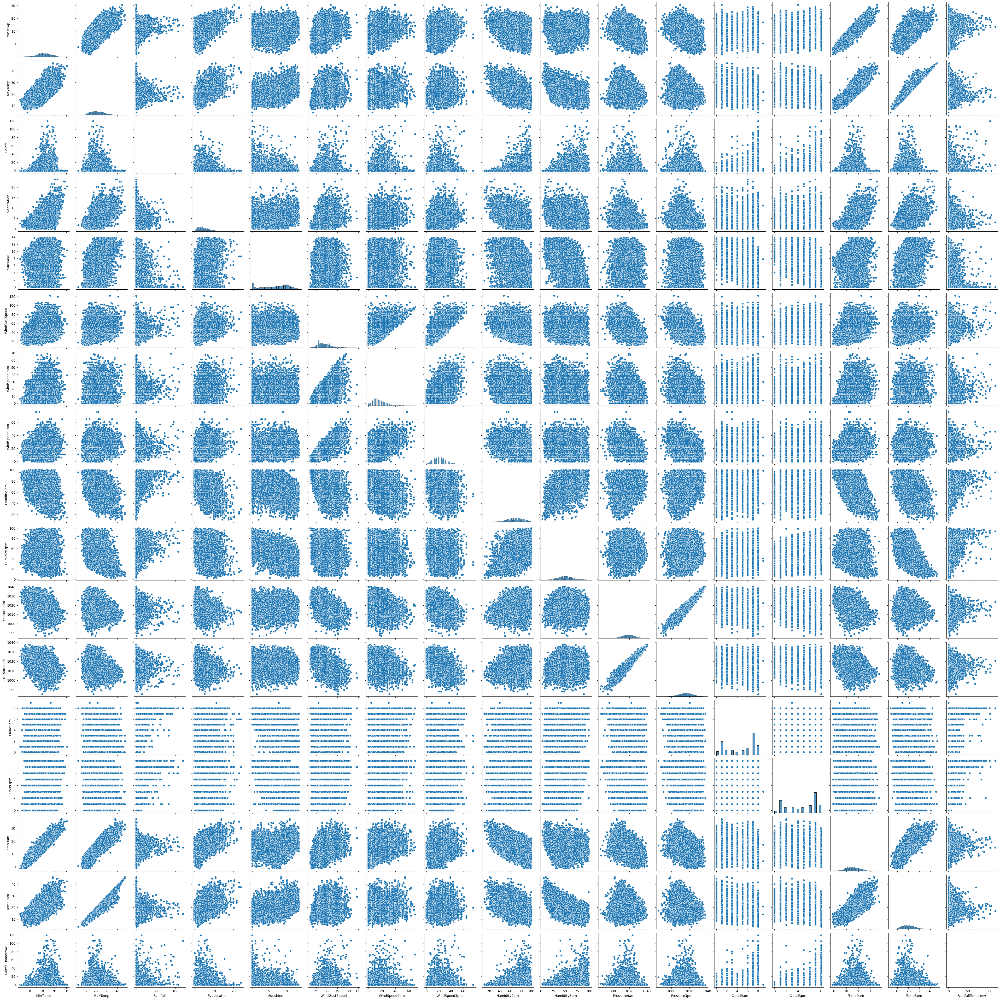

In [22]:
sbn.pairplot(data)